In [2]:
import pandas as pd

import warnings
warnings.filterwarnings("ignore")
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np

import seaborn as sns


import latexify

In [4]:


@latexify.function
def compute_order_parameter(group: pd.DataFrame) -> pd.Series:
    """
    Compute the order parameter for the given group
    """
    
    # print(group)
    N = len(group)  # use the length of the group
    sum_exp = np.sum(np.exp(1j * group))  # sum of complex exponentials of the angles
    order_parameter = np.abs(sum_exp) / N  # order parameter
    return pd.Series([order_parameter] * len(group), index=group.index)


compute_order_parameter


In [5]:
def plot_data(data: pd.DataFrame, title: str=""):


    prey     = data[data['isPredator'] == 0]
    predator = data[data['isPredator'] == 1]

    steps = data['step'].astype(int).unique()

    trajectory_prey     = prey.groupby('step')[['x', 'y']].mean()
    trajectory_predator = predator.groupby('step')[['x', 'y']].mean()


    last_steps_positions_predators = predator[predator['step'] == predator['step'].max()]
    last_steps_positions_prey      = prey[prey['step'] == prey['step'].max()]


    prey['order_parameter']     = prey.groupby('step')['theta'].transform(compute_order_parameter)
    predator['order_parameter'] = predator.groupby('step')['theta'].transform(compute_order_parameter)


    swarm_pred_center_per_step = predator.groupby('step')[['x', 'y']].mean()
    swarm_prey_center_per_step = prey.groupby('step')[['x', 'y']].mean()

    distance = np.sqrt((swarm_prey_center_per_step['x'] - swarm_pred_center_per_step['x'])**2 + (swarm_prey_center_per_step['y'] - swarm_pred_center_per_step['y'])**2)

    # velocity use vx and vy
    predator['speed'] = np.sqrt(predator['vx']**2 + predator['vy']**2)
    prey['speed'] = np.sqrt(prey['vx']**2 + prey['vy']**2)


    mean_speed_pred_per_step = predator.groupby('step')['speed'].mean()
    mean_speed_prey_per_step = prey.groupby('step')['speed'].mean()

    fig, axs = plt.subplots(1, 4, figsize=(20, 5))

    plt.suptitle(title)

    # plot trajectory
    axs[0].plot(trajectory_prey['x'], trajectory_prey['y'], label='Prey')
    axs[0].plot(trajectory_predator['x'], trajectory_predator['y'], label='Predator')

    axs[0].scatter(last_steps_positions_prey['x'], last_steps_positions_prey['y'], label='Prey', color='blue')
    # change color of the predator if no sensor
    predators_with_sensor = last_steps_positions_predators[last_steps_positions_predators['distanceSensor'] == 1]
    predators_without_sensor = last_steps_positions_predators[last_steps_positions_predators['distanceSensor'] == 0]
    axs[0].scatter(predators_with_sensor['x'], predators_with_sensor['y'], label='Predator', color='red')
    axs[0].scatter(predators_without_sensor['x'], predators_without_sensor['y'], label='Predator no sensor', color='green')

    axs[0].quiver(last_steps_positions_prey['x'], last_steps_positions_prey['y'], np.cos(last_steps_positions_prey['theta']), np.sin(last_steps_positions_prey['theta']), color='blue')
    axs[0].quiver(last_steps_positions_predators['x'], last_steps_positions_predators['y'], np.cos(last_steps_positions_predators['theta']), np.sin(last_steps_positions_predators['theta']), color='red')

    axs[0].set_xlabel('x')
    axs[0].set_ylabel('y')
    axs[0].set_title('Trajectory')
    axs[0].legend()

    # plot order parameter
    axs[1].plot(prey['step'], prey['order_parameter'], label='Prey')
    axs[1].plot(predator['step'], predator['order_parameter'], label='Predator')
    axs[1].set_xlabel('step')
    axs[1].set_ylabel('order_parameter')
    axs[1].set_title('Order Parameter')
    axs[1].legend()


    # plot average distance between the two swarms
    axs[2].plot(steps, distance)
    axs[2].set_xlabel('step')
    axs[2].set_ylabel('distance')
    axs[2].set_title('Distance between the two swarms')

    # plot average distance between the two swarms
    axs[3].plot(steps, mean_speed_pred_per_step, label='Predator')
    axs[3].plot(steps, mean_speed_prey_per_step, label='Prey')
    axs[3].set_xlabel('step')
    axs[3].set_ylabel('speed')
    axs[3].set_title('Mean Speed')
    axs[3].legend()

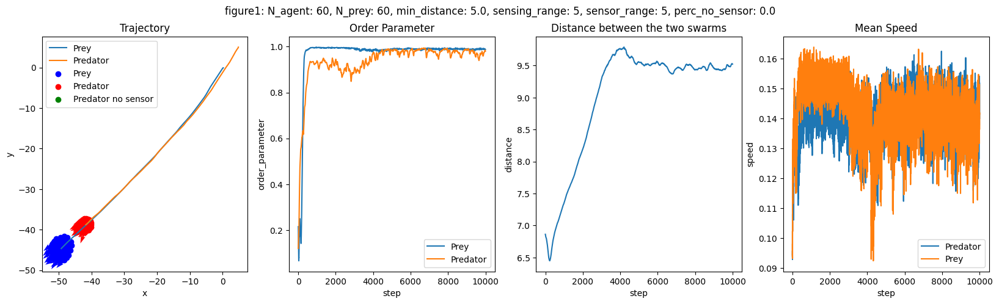

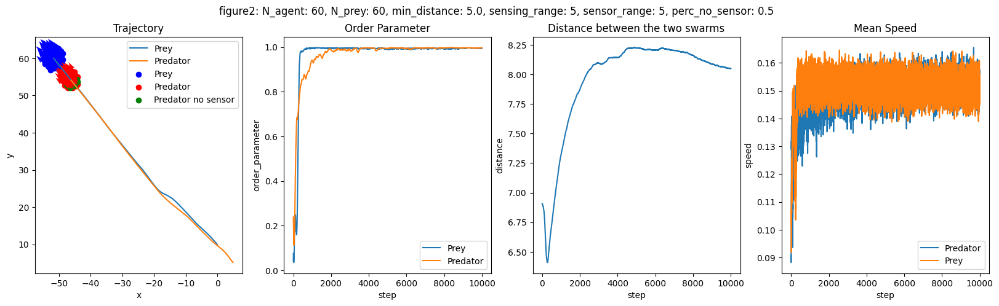

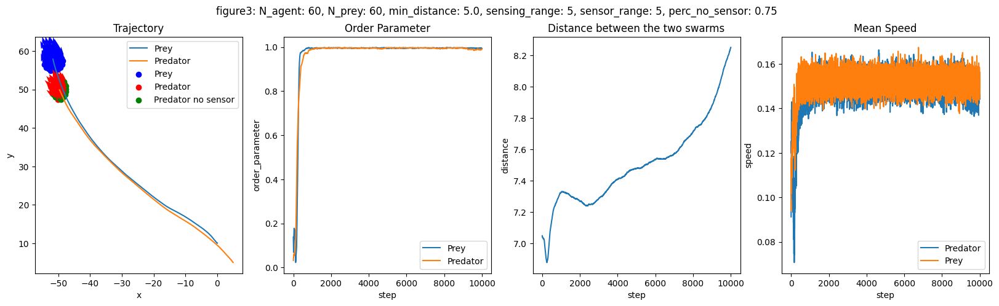

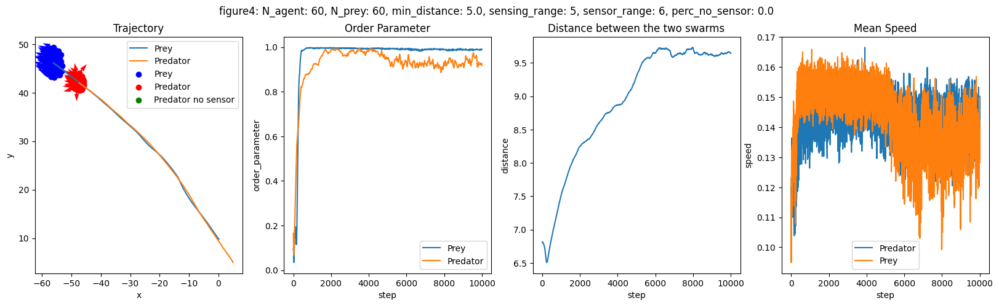

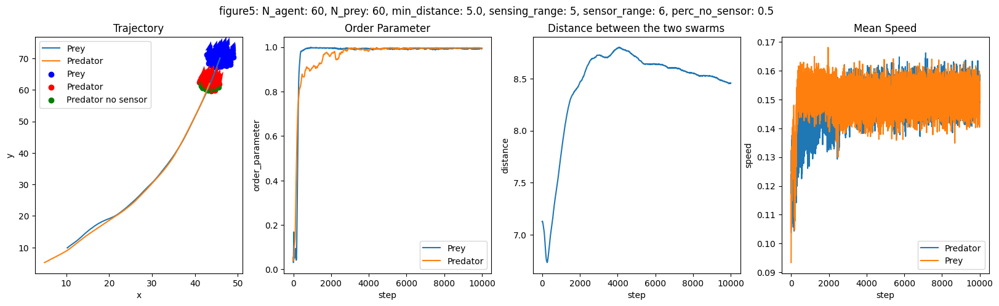

...

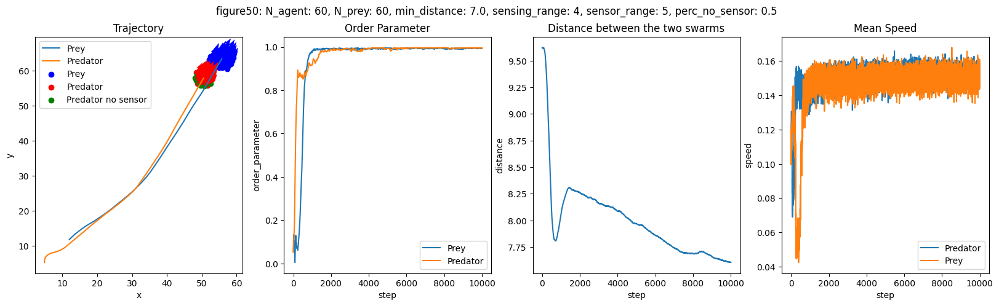

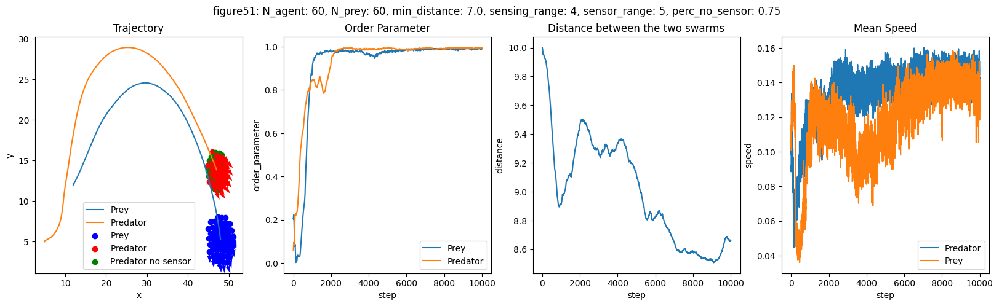

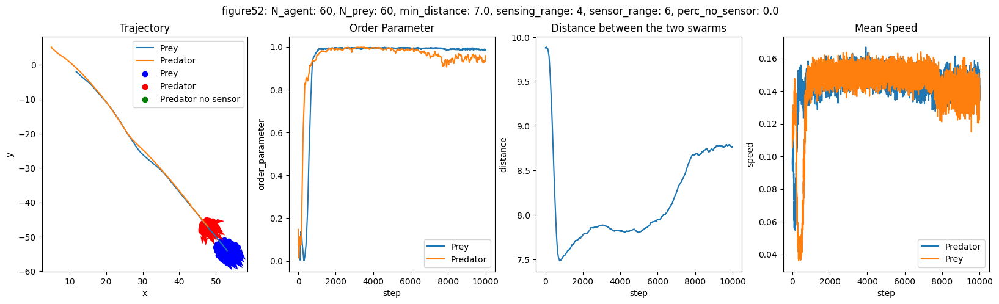

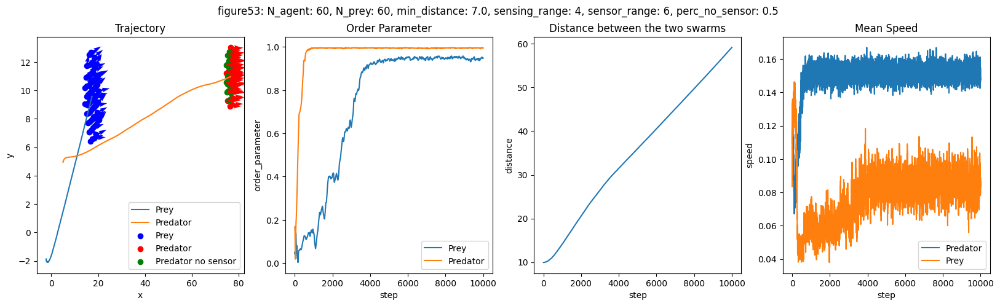

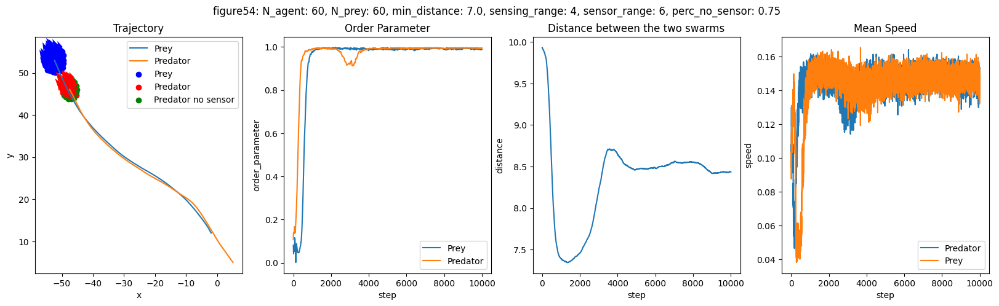

In [7]:


experiment_id_ = "ratioTest"
experiment_id              = experiment_id_
N_preys                    = [60]
N_agent                    = [60]
min_distance               = [5.0, 6.0, 7.0] # was trying with 5.
            # testing 1:1, 2:1, 3:2 ratio
sensing_range              = [5, 3, 4] # prey
sensor_range               = [5, 6]    # predator
percentage_no_sensor       = [0.0, 0.5, 0.75]
total_steps_per_simulation = 10000
pdm                        = True
path = f'dataPreyPredator/{experiment_id}'

i = 1
for n_prey in N_preys:
    for n_agent in N_agent:
        for min_d in min_distance:
            for s_range in sensing_range:
                for sensor_r in sensor_range:
                    for perc_no_sensor in percentage_no_sensor:
                        try:
                            data = pd.read_csv(f'{path}/Agents[{n_agent}]_Preys[{n_prey}]_steps[{total_steps_per_simulation}]_precentageNoSensor[{perc_no_sensor}]_minDistance[{min_d}]_sensingRange[{s_range}]_sensorRange[{sensor_r}]_pdm{pdm}_exp[{experiment_id}].csv')
                            plot_data(data, title=f'figure{i}: N_agent: {n_agent}, N_prey: {n_prey}, min_distance: {min_d}, sensing_range: {s_range}, sensor_range: {sensor_r}, perc_no_sensor: {perc_no_sensor}')
                            plt.show()
                            i += 1
                        except FileNotFoundError:
                            pass

In [11]:
from fractions import Fraction
from itertools import product

ratios = [Fraction(sensor, sensing).limit_denominator() for sensing, sensor in product(sensing_range, sensor_range)]
ratios_str = [f"{r.numerator}:{r.denominator}" for r in ratios]


# Dictionary to store data for each ratio for N = 30
data_dict_N30 = {}

# Dictionary to store data for each ratio for N = 60
data_dict_N60 = {}

# Iterate over the ratio combinations and load data
for ratio_str in ratios_str:
    ratio_data_N30 = []  # Initialize list for N = 30
    ratio_data_N60 = []  # Initialize list for N = 60
    for n_prey in N_preys:
        for n_agent in N_agent:
            for min_d in min_distance:
                for s_range in sensing_range:
                    for sensor_r in sensor_range:
                        for perc_no_sensor in percentage_no_sensor:
                            try:
                                file = f'{path}/Agents[{n_agent}]_Preys[{n_prey}]_steps[{total_steps_per_simulation}]_precentageNoSensor[{perc_no_sensor}]_minDistance[{min_d}]_sensingRange[{s_range}]_sensorRange[{sensor_r}]_pdm{pdm}_exp[{experiment_id}].csv'
                                
                                # Ensure the ratio string is in the file name
                                current_ratio = f"{Fraction(sensor_r, s_range).limit_denominator().numerator}:{Fraction(sensor_r, s_range).limit_denominator().denominator}"
                                
                                # Check if the ratio matches the current ratio string
                                if ratio_str == current_ratio:
                                    # Store the data in the appropriate dictionary based on N_agent value
                                    if n_agent == 30:
                                        ratio_data_N30.append(pd.read_csv(file))
                                    elif n_agent == 60:
                                        ratio_data_N60.append(pd.read_csv(file))
                            except FileNotFoundError:
                                pass
    # Store data lists in respective dictionaries
    data_dict_N30[ratio_str] = ratio_data_N30
    data_dict_N60[ratio_str] = ratio_data_N60

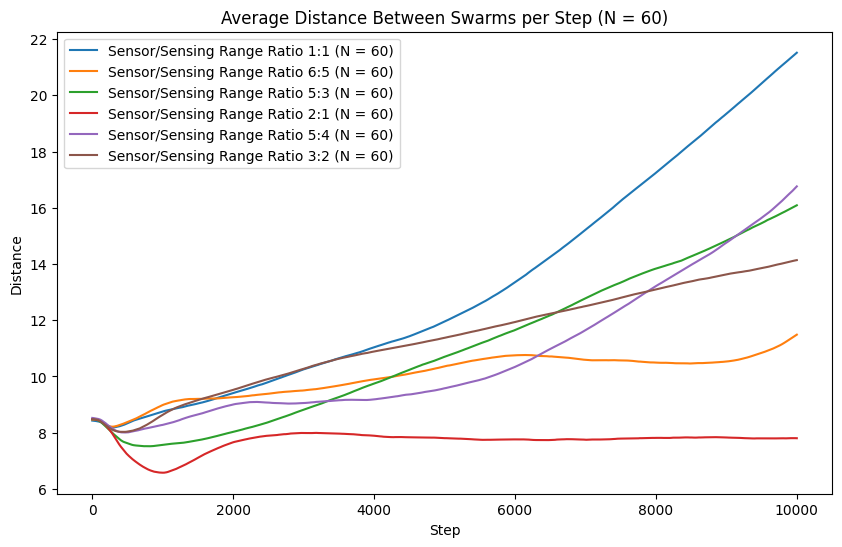

In [12]:

avg_distances_N30 = {}  # Dictionary to store average distances between swarms for N = 30
avg_distances_N60 = {}  # Dictionary to store average distances between swarms for N = 60

# Calculate average distance between swarms per step for each ratio for N = 30
# for ratio_str, ratio_data in data_dict_N30.items():
#     ratio_avg_distances = []
#     for data in ratio_data:
#         prey = data[data['isPredator'] == 0]
#         predator = data[data['isPredator'] == 1]
        
#         swarm_pred_center_per_step = predator.groupby('step')[['x', 'y']].mean()
#         swarm_prey_center_per_step = prey.groupby('step')[['x', 'y']].mean()

#         distance = np.sqrt((swarm_prey_center_per_step['x'] - swarm_pred_center_per_step['x'])**2 + 
#                            (swarm_prey_center_per_step['y'] - swarm_pred_center_per_step['y'])**2)
        
#         ratio_avg_distances.append(distance)
    
#     avg_distances_N30[ratio_str] = np.mean(ratio_avg_distances, axis=0)

# Calculate average distance between swarms per step for each ratio for N = 60
for ratio_str, ratio_data in data_dict_N60.items():
    ratio_avg_distances = []
    for data in ratio_data:
        prey = data[data['isPredator'] == 0]
        predator = data[data['isPredator'] == 1]
        
        swarm_pred_center_per_step = predator.groupby('step')[['x', 'y']].mean()
        swarm_prey_center_per_step = prey.groupby('step')[['x', 'y']].mean()

        distance = np.sqrt((swarm_prey_center_per_step['x'] - swarm_pred_center_per_step['x'])**2 + 
                           (swarm_prey_center_per_step['y'] - swarm_pred_center_per_step['y'])**2)
        
        ratio_avg_distances.append(distance)
    
    avg_distances_N60[ratio_str] = np.mean(ratio_avg_distances, axis=0)

# Plotting for N = 30
# fig, ax = plt.subplots(figsize=(10, 6))
# for ratio_str, avg_distance_per_step in avg_distances_N30.items():
#     ax.plot(range(total_steps_per_simulation), avg_distance_per_step, label=f"Sensor/Sensing Range Ratio {ratio_str} (N = 30)")

# ax.set_title('Average Distance Between Swarms per Step (N = 30)')
# ax.set_xlabel('Step')
# ax.set_ylabel('Distance')
# ax.legend()
# plt.show()

# Plotting for N = 60
fig, ax = plt.subplots(figsize=(10, 6))
for ratio_str, avg_distance_per_step in avg_distances_N60.items():
    ax.plot(range(total_steps_per_simulation), avg_distance_per_step, label=f"Sensor/Sensing Range Ratio {ratio_str} (N = 60)")

ax.set_title('Average Distance Between Swarms per Step (N = 60)')
ax.set_xlabel('Step')
ax.set_ylabel('Distance')
ax.legend()
plt.show()



In [28]:
# Generate ratios based on Min_distance and N
ratios_min_distance_N = [(min_d, n_agent) for min_d, n_agent in product(min_distance, N_agent)]
ratios_str_min_distance_N = [f"{min_d}:{n_agent}" for min_d, n_agent in ratios_min_distance_N]

# Dictionary to store data for each ratio for Min_distance and N
data_dict_min_distance_N = {ratio_str: [] for ratio_str in ratios_str_min_distance_N}

# Iterate over the ratio combinations and load data
for ratio_str in ratios_str_min_distance_N:
    ratio_data = []  # Initialize list for current ratio
    min_d, n_agent = map(float, ratio_str.split(':'))  # Extract Min_distance and N from ratio string
    for n_prey in N_preys:
        for s_range in sensing_range:
            for sensor_r in sensor_range:
                for perc_no_sensor in percentage_no_sensor:
                    try:
                        file = f'{path}/Agents[{int(n_agent)}]_Preys[{n_prey}]_steps[{total_steps_per_simulation}]_precentageNoSensor[{perc_no_sensor}]_minDistance[{min_d}]_sensingRange[{s_range}]_sensorRange[{sensor_r}]_exp[{experiment_id}].csv'
                        ratio_data.append(pd.read_csv(file))
                    except FileNotFoundError:
                        # print(file)
                        pass
    # Store data list in respective dictionary entry
    data_dict_min_distance_N[ratio_str] = ratio_data


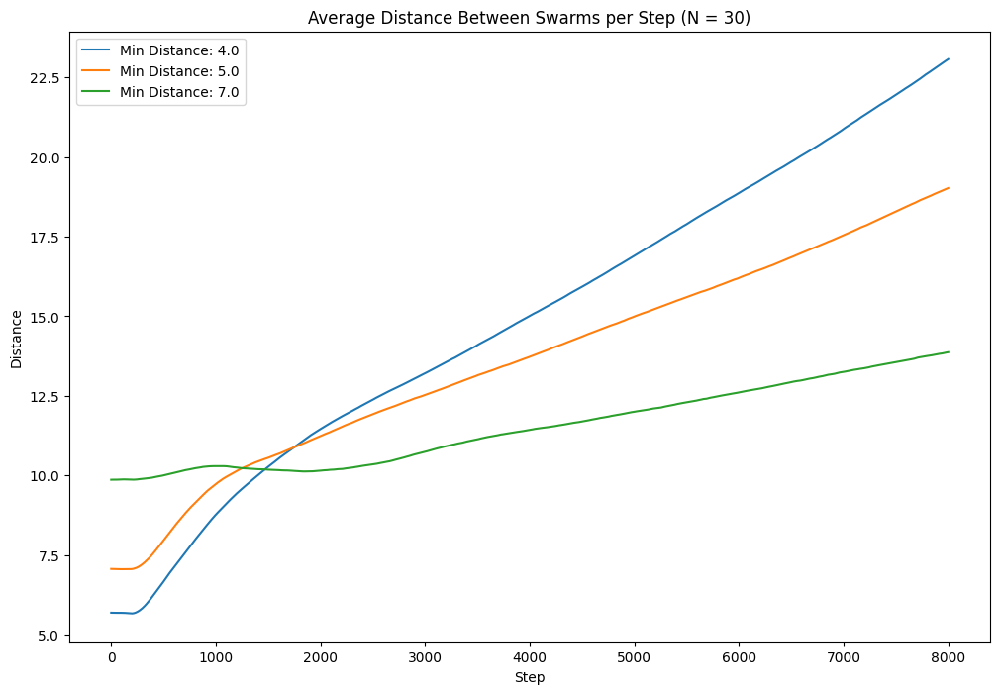

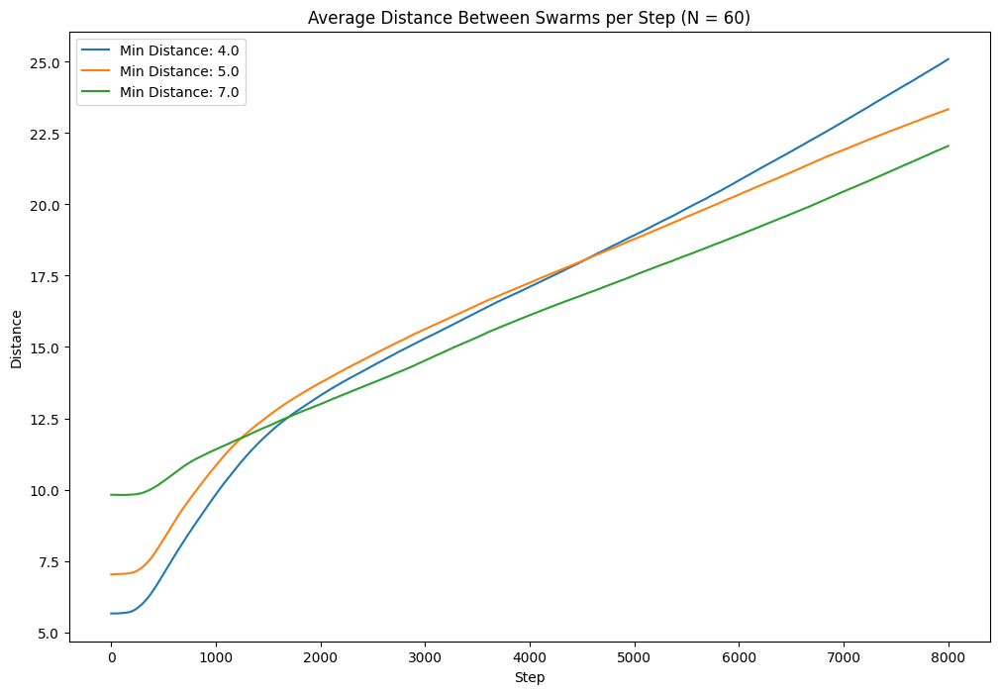

In [29]:

# print(data_dict_min_distance_N)
# Dictionary to store average distances for each ratio for Min_distance and N
avg_distances_min_distance_N = {ratio_str: np.zeros(total_steps_per_simulation) for ratio_str in ratios_str_min_distance_N}

# Calculate average distance between swarms per step for each ratio for Min_distance and N
for ratio_str, ratio_data in data_dict_min_distance_N.items():
    for data in ratio_data:
        prey = data[data['isPredator'] == 0]
        predator = data[data['isPredator'] == 1]
        
        swarm_pred_center_per_step = predator.groupby('step')[['x', 'y']].mean()
        swarm_prey_center_per_step = prey.groupby('step')[['x', 'y']].mean()

        distance = np.sqrt((swarm_prey_center_per_step['x'] - swarm_pred_center_per_step['x'])**2 + 
                           (swarm_prey_center_per_step['y'] - swarm_pred_center_per_step['y'])**2)
        
        avg_distances_min_distance_N[ratio_str] += distance

# Normalize average distances by the number of simulations for each ratio for Min_distance and N
for ratio_str, ratio_data in data_dict_min_distance_N.items():
    num_simulations = len(ratio_data)
    avg_distances_min_distance_N[ratio_str] /= num_simulations

# Plotting for N = 30
fig, ax1 = plt.subplots(figsize=(12, 8))

for min_d in min_distance:
    ratio_str = f"{min_d}:30"
    avg_distance_per_step = avg_distances_min_distance_N[ratio_str]
    ax1.plot(range(total_steps_per_simulation), avg_distance_per_step, label=f"Min Distance: {min_d}")

ax1.set_title('Average Distance Between Swarms per Step (N = 30)')
ax1.set_xlabel('Step')
ax1.set_ylabel('Distance')
ax1.legend()
plt.show()

# Plotting for N = 60
fig, ax2 = plt.subplots(figsize=(12, 8))

for min_d in min_distance:
    ratio_str = f"{min_d}:60"
    avg_distance_per_step = avg_distances_min_distance_N[ratio_str]
    ax2.plot(range(total_steps_per_simulation), avg_distance_per_step, label=f"Min Distance: {min_d}")

ax2.set_title('Average Distance Between Swarms per Step (N = 60)')
ax2.set_xlabel('Step')
ax2.set_ylabel('Distance')
ax2.legend()
plt.show()


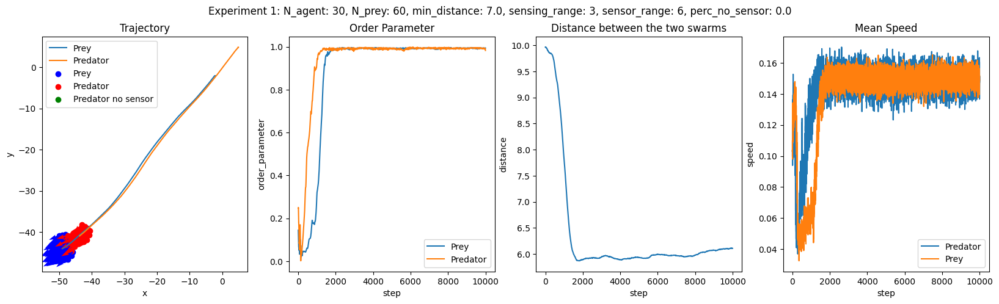

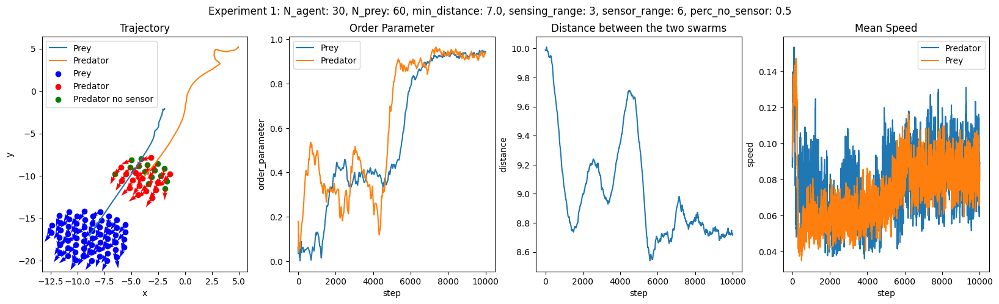

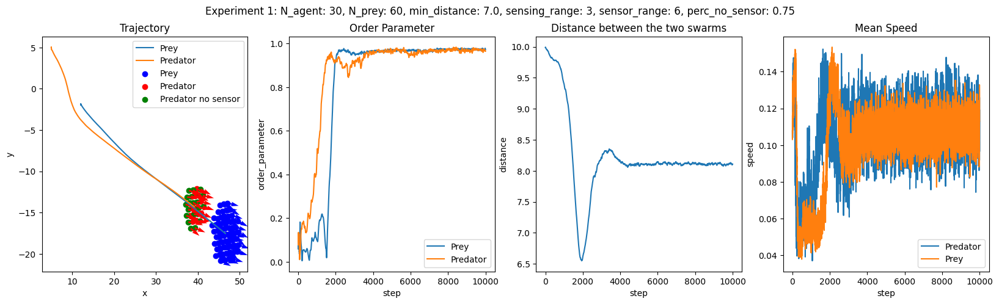

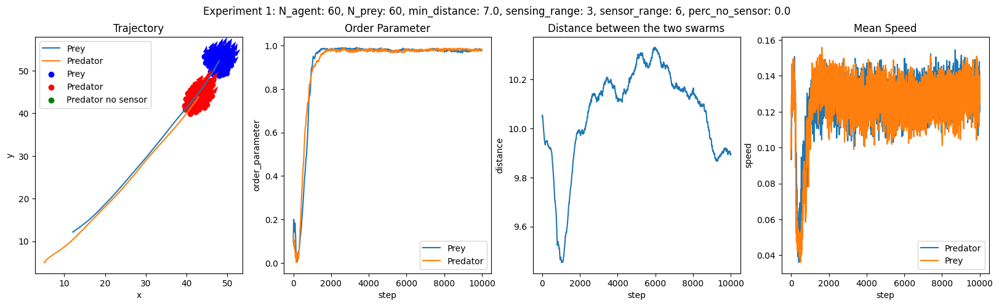

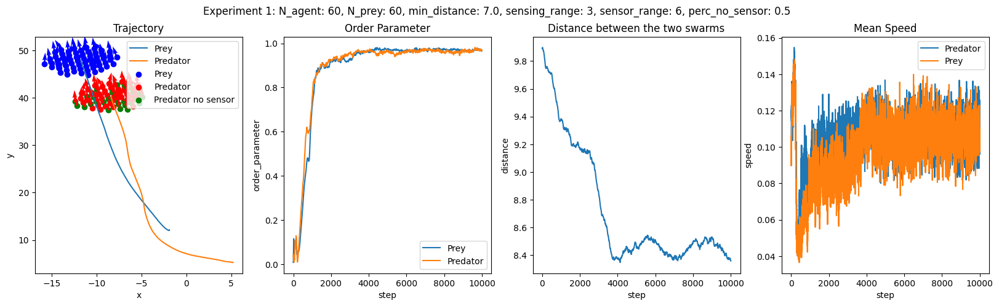

...

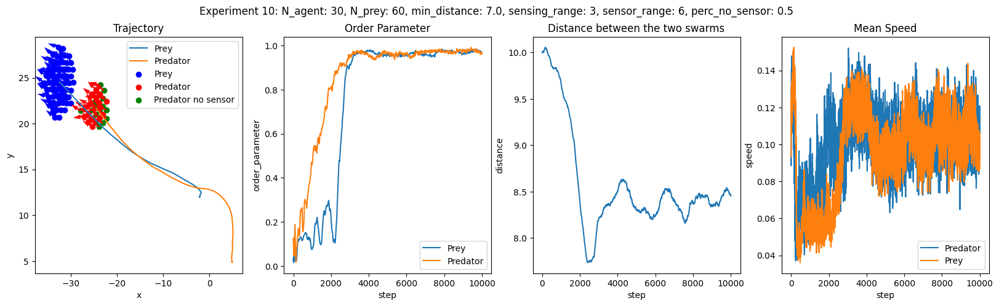

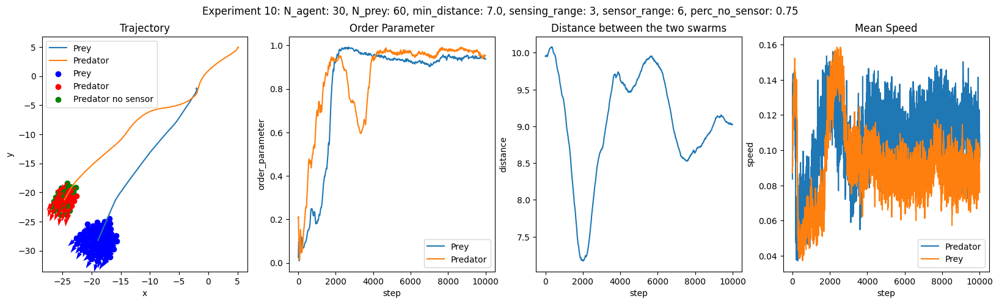

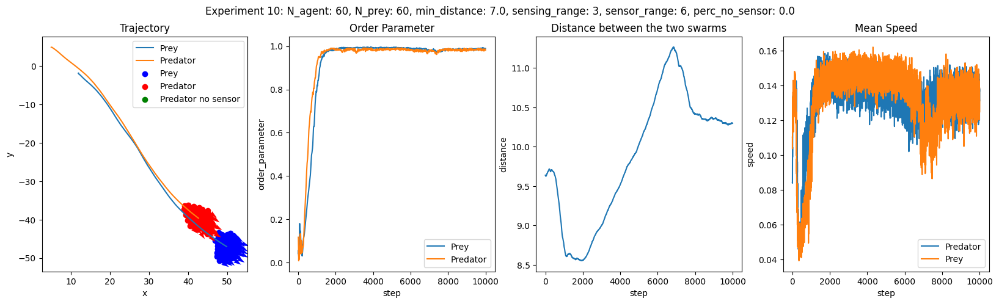

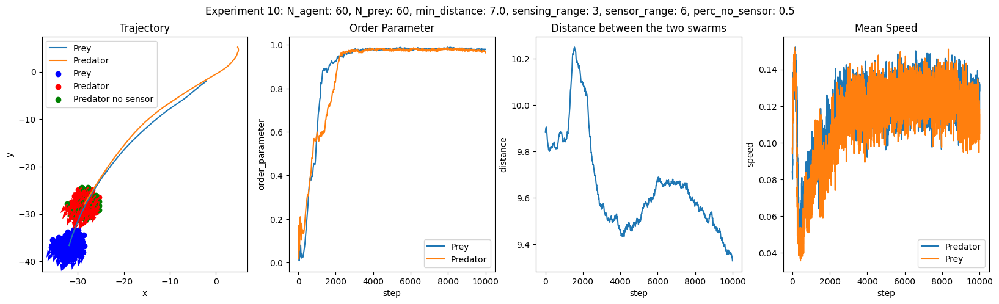

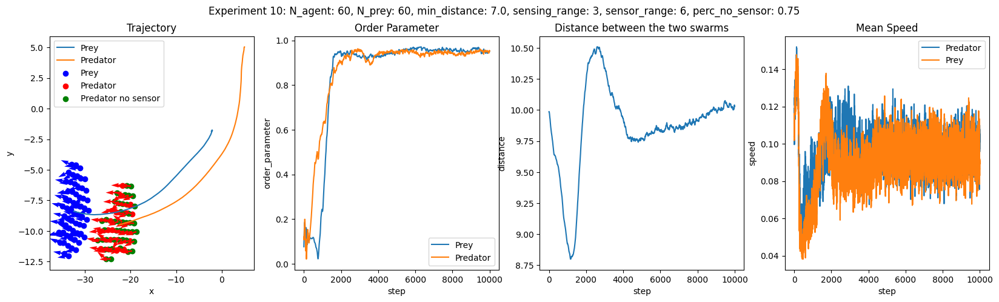

In [13]:
# trying what I guess would be the best params


experiment_id_             = [str(i) for i in range(1, 11)]
N_preys                    = [60]
N_agent                    = [30, 60]
min_distance               = [7.0]
sensing_range              = [3]
sensor_range               = [6]
percentage_no_sensor       = [0.0, 0.5, 0.75]
total_steps_per_simulation = 10000

dfs = {}
for exp_id in experiment_id_:
    for n_prey in N_preys:
        for n_agent in N_agent:
            for min_d in min_distance:
                for s_range in sensing_range:
                    for sensor_r in sensor_range:
                        for perc_no_sensor in percentage_no_sensor:
                            path = f'dataPreyPredator/{exp_id}'

                            try:
                                data = pd.read_csv(f'{path}/Agents[{n_agent}]_Preys[{n_prey}]_steps[{total_steps_per_simulation}]_precentageNoSensor[{perc_no_sensor}]_minDistance[{min_d}]_sensingRange[{s_range}]_sensorRange[{sensor_r}]_exp[{exp_id}].csv')
                                dfs[(exp_id, n_prey, n_agent, min_d, s_range, sensor_r, perc_no_sensor)] = data
                                plot_data(data, title=f'Experiment {exp_id}: N_agent: {n_agent}, N_prey: {n_prey}, min_distance: {min_d}, sensing_range: {s_range}, sensor_range: {sensor_r}, perc_no_sensor: {perc_no_sensor}')
                                plt.show()
                            except FileNotFoundError:
                                pass

In [17]:
data_N30_0   = [data for key, data in dfs.items() if key[2] == 30 and key[6] == 0.0]
data_N30_05  = [data for key, data in dfs.items() if key[2] == 30 and key[6] == 0.5]
data_N30_075 = [data for key, data in dfs.items() if key[2] == 30 and key[6] == 0.75]

data_N60_0   = [data for key, data in dfs.items() if key[2] == 60 and key[6] == 0.0]
data_N60_05  = [data for key, data in dfs.items() if key[2] == 60 and key[6] == 0.5]
data_N60_075 = [data for key, data in dfs.items() if key[2] == 60 and key[6] == 0.75]

# mean distance between the two swarms per step for each experiment
data_predator_N30_0   = [data[data['isPredator'] == 1] for data in data_N30_0]
data_prey_N30_0       = [data[data['isPredator'] == 0] for data in data_N30_0]



In [39]:
import math 
import latexify

@latexify.function
def solve_quadratic(a, b, c):
    x1 = (-b + math.sqrt(b**2 - 4*a*c)) / (2*a)
    x2 = (-b - math.sqrt(b**2 - 4*a*c)) / (2*a)
    return x1, x2


solve_quadratic